# Deep Convolutional Generative Adversarial Network

This tutorial demonstrates how to generate images of flowers using a [Deep Convolutional Generative Adversarial Network](https://arxiv.org/pdf/1511.06434.pdf) (DCGAN).

## What are GANs?
[Generative Adversarial Networks](https://arxiv.org/abs/1406.2661) (GANs) are one of the most interesting ideas in computer science today. Two models are trained simultaneously by an adversarial process. A *generator* ("the artist") learns to create images that look real, while a *discriminator* ("the art critic") learns to tell real images apart from fakes.


During training, the *generator* progressively becomes better at creating images that look real, while the *discriminator* becomes better at telling them apart. The process reaches equilibrium when the *discriminator* can no longer distinguish real images from fakes.


This notebook demonstrates this process on the tf_flowers dataset.


### Setup

In [1]:
import tensorflow as tf

In [2]:
tf.__version__

'2.10.1'

In [3]:
# To generate GIFs
!pip install imageio
!pip install git+https://github.com/tensorflow/docs

In [4]:
import glob
import imageio
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
from tensorflow.keras import layers
import time
from IPython import display

In [5]:
import pathlib
archive = "flower_photos"
data_dir = pathlib.Path(archive).with_suffix('')

In [6]:
image_count = len(list(data_dir.glob('*/*.jpg')))
print(image_count)

3670


### Load and prepare the dataset


In [7]:
BATCH_SIZE = 128
img_height = 64
img_width = 64

In [8]:
train_images = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  label_mode= None,
  seed=3,
  image_size=(img_height, img_width),
  batch_size=BATCH_SIZE)

Found 3670 files belonging to 1 classes.


In [9]:
normalization_layer = tf.keras.layers.Rescaling(1./127.5, offset=-1)
normalized_ds = train_images.map(lambda x: (normalization_layer(x)))

In [10]:
def image_to_uint8(x):
  """Converts [-1, 1] float array to [0, 255] uint8."""
  x = np.asarray(x)
  x = (127.5 )* (x+1)
  x = np.clip(x, 0, 255)
  x = x.astype(np.uint8)
  return x

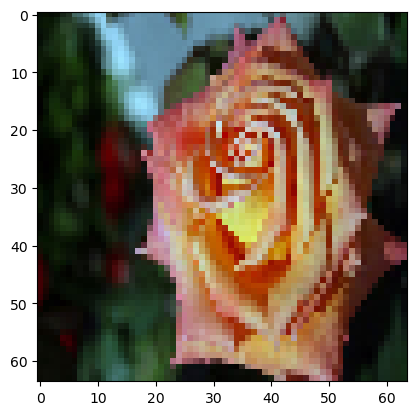

In [11]:
for image_batch in normalized_ds:
    plt.imshow(image_to_uint8(image_batch[0]))
    break

## Create the models

Both the generator and discriminator are defined using the [Keras Sequential API](https://www.tensorflow.org/guide/keras#sequential_model).

### The Generator

The generator uses `tf.keras.layers.Conv2DTranspose` (upsampling) layers to produce an image from a seed (random noise). Start with a `Dense` layer that takes this seed as input, then upsample several times until you reach the desired image size of 64x64x3. Notice the `tf.keras.layers.LeakyReLU` activation for each layer, except the output layer which uses tanh.

In [12]:
def make_generator_model():
    model = tf.keras.models.Sequential()
    model.add(layers.Dense(4*4*512,input_shape=(100,),use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))
    model.add(layers.Reshape((4,4,512)))

    model.add(layers.Conv2DTranspose(256,(5,5))) # stride (1,1) keeps the same shape as that of input
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))
    
    model.add(layers.Conv2DTranspose(128,(5,5),strides=(2,2),padding='same'))     # stride (2,2) doubles the size of the input 
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))

    model.add(layers.Conv2DTranspose(64,(5,5),strides=(2,2),padding='same'))     # stride (2,2) doubles the size of the input 
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))

    
    model.add(layers.Conv2DTranspose(3,(5,5),strides=(2,2),padding='same'))
    model.add(layers.Activation('tanh'))

    return model

In [13]:
make_generator_model().summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 8192)              819200    
                                                                 
 batch_normalization (BatchN  (None, 8192)             32768     
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 8192)              0         
                                                                 
 reshape (Reshape)           (None, 4, 4, 512)         0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 8, 8, 256)        3277056   
 nspose)                                                         
                                                                 
 batch_normalization_1 (Batc  (None, 8, 8, 256)        1

Use the (as yet untrained) generator to create an image.

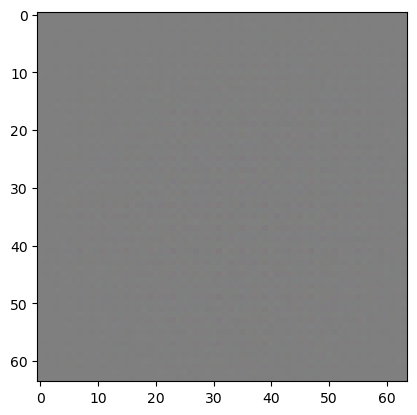

In [14]:
generator = make_generator_model()

noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)

plt.imshow(image_to_uint8(generated_image[0]))

### The Discriminator

The discriminator is a CNN-based image classifier.

In [15]:
def make_discriminator_model():
    net = tf.keras.Sequential()
    input_shape = [64, 64, 3]
    
    net.add(layers.InputLayer(input_shape=input_shape))
    net.add(layers.Dropout(0.5))
    net.add(layers.Conv2D(64, 5, strides=2, input_shape=input_shape, padding='same'))
    net.add(layers.LeakyReLU(0.2))

    net.add(layers.Conv2D(128, 5, strides=2, padding='same'))
    net.add(layers.BatchNormalization())
    net.add(layers.LeakyReLU(0.2))
    
    net.add(layers.Conv2D(256, 5, strides=2, padding='same'))
    net.add(layers.BatchNormalization())
    net.add(layers.LeakyReLU(0.2))
    
    net.add(layers.Conv2D(512, 5, strides=2, padding='same'))
    net.add(layers.BatchNormalization())
    net.add(layers.LeakyReLU(0.2))
    
    net.add(layers.Conv2D(1, 4))
    net.add(layers.Activation('sigmoid'))
    
    return net

Use the (as yet untrained) discriminator to classify the generated images as real or fake. The model will be trained to output positive values for real images, and negative values for fake images.

In [16]:
discriminator = make_discriminator_model()
decision = discriminator(generated_image)
print (decision)

tf.Tensor([[[[0.5000094]]]], shape=(1, 1, 1, 1), dtype=float32)


## Define the loss and optimizers

Define loss functions and optimizers for both models.


In [17]:
# This method returns a helper function to compute cross entropy loss
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=False)

### Discriminator loss

This method quantifies how well the discriminator is able to distinguish real images from fakes. It compares the discriminator's predictions on real images to an array of 1s, and the discriminator's predictions on fake (generated) images to an array of 0s.

In [18]:
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

### Generator loss
The generator's loss quantifies how well it was able to trick the discriminator. Intuitively, if the generator is performing well, the discriminator will classify the fake images as real (or 1). Here, compare the discriminators decisions on the generated images to an array of 1s.

In [19]:
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

The discriminator and the generator optimizers are different since you will train two networks separately.

In [20]:
generator_optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0002, beta_1= 0.5, beta_2= 0.999 )
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0002, beta_1= 0.5, beta_2= 0.999 )


### Save checkpoints
This notebook also demonstrates how to save and restore models, which can be helpful in case a long running training task is interrupted.

In [21]:
checkpoint_dir = "./training_checkpoints"
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

## Define the training loop


In [22]:
EPOCHS = 500
noise_dim = 100
num_examples_to_generate = 16

# You will reuse this seed overtime (so it's easier)
# to visualize progress in the animated GIF)
seed = tf.random.normal([num_examples_to_generate, noise_dim])

The training loop begins with generator receiving a random seed as input. That seed is used to produce an image. The discriminator is then used to classify real images (drawn from the training set) and fakes images (produced by the generator). The loss is calculated for each of these models, and the gradients are used to update the generator and discriminator.

In [23]:
# Notice the use of `tf.function`
# This annotation causes the function to be "compiled".
@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
      generated_images = generator(noise, training=True)

      real_output = discriminator(images, training=True)
      fake_output = discriminator(generated_images, training=True)

      gen_loss = generator_loss(fake_output)
      disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

In [24]:
def train(dataset, epochs):
  for epoch in range(epochs):
    start = time.time()

    for image_batch in dataset:
      train_step(image_batch)

        # Produce images for the GIF as you go
    display.clear_output(wait=True)
    generate_and_save_images(generator,
                                     epoch,
                                     seed)

    # Save the model every 50 epochs
    if (epoch + 1) % 50 == 0:
      checkpoint.save(file_prefix = checkpoint_prefix)

    print ('Time for epoch {} is {} sec'.format(epoch , time.time()-start))

  # Generate after the final epoch
  display.clear_output(wait=True)
  generate_and_save_images(generator,
                           epochs,
                           seed)

**Generate and save images**


In [25]:
def generate_and_save_images(model, epoch, test_input):
  # Notice `training` is set to False.
  # This is so all layers run in inference mode (batchnorm).
  predictions = model(test_input, training=False)

  fig = plt.figure(figsize=(6, 6))

  for i in range(predictions.shape[0]):
      plt.subplot(4, 4, i+1)
      plt.imshow(image_to_uint8(predictions[i]))
      plt.axis('off')
  if (epoch) % 10 == 0:
      plt.savefig("./gif/image_at_epoch_{:04d}.png".format(epoch), bbox_inches='tight')
  plt.show()

## Train the model
Call the `train()` method defined above to train the generator and discriminator simultaneously. Note, training GANs can be tricky. It's important that the generator and discriminator do not overpower each other (e.g., that they train at a similar rate).

At the beginning of the training, the generated images look like random noise. As training progresses, the generated flowers will look increasingly real. After about 500 epochs, they resemble flowers.

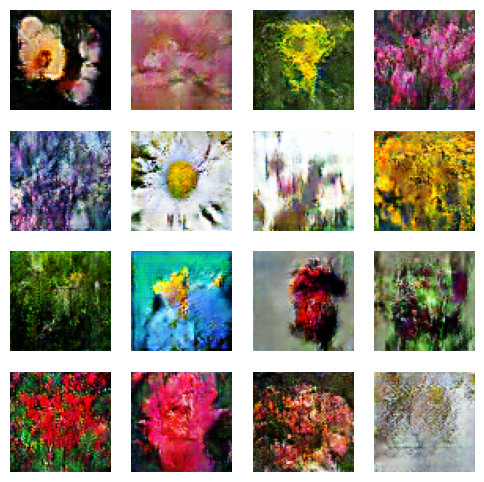

In [26]:
train(normalized_ds, EPOCHS)

Restore the latest checkpoint.

In [27]:
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

## Create a GIF


In [28]:
# Display a single image using the epoch number
def display_image(epoch_no):
  return PIL.Image.open("./gif/image_at_epoch_{:04d}.png".format(epoch_no))

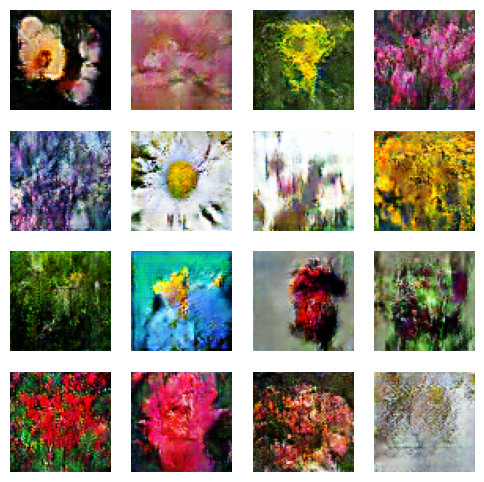

In [29]:
display_image(EPOCHS)

Use `imageio` to create an animated gif using the images saved during training.

In [30]:
anim_file = "./gif/dcgan.gif"

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob("./gif/image*.png")
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)

C:\Users\Amir\AppData\Local\Temp\ipykernel_792\3212943283.py:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)
C:\Users\Amir\AppData\Local\Temp\ipykernel_792\3212943283.py:9: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)



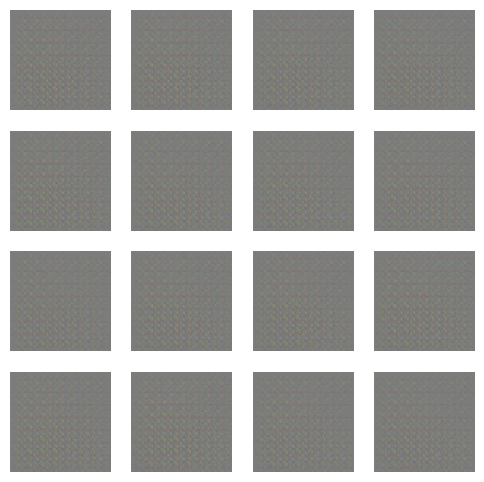

In [31]:
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)